<h1><center>Connections among Global Mortality, Health Care Coverage, Education, Economy, and Pollution</center></h1>

<h3><center>DATA 604 (Fall 2020) - Group 6: Giesbrecht, Lam, Leung, Nelson, Nguyen</center><h3>


In [1]:
#conda install -c plotly plotly

In [2]:
import mysql.connector
import pandas as pd
from mysql.connector import errorcode
import plotly.express as px

# Introduction 

Purpose: Study the relationship between global data of stressors in countries that could indicate a population’s prosperity and death by popular diseases <br>

Examples of relationships:
- **Mortality:** increases in poverty, poor living environment, lack of education, & health care policies
- **Education:** facilitates economic growth, awareness of environmental sustainability, effective policies
- **Economic activities:** can lead to environmental issues, health quality
- **Pollution:** and **Health coverage:** can affect health/mortality severely

Studying the potential relationships could help a country to better understand how to better deal with popular deadly diseases and in what areas they could improve to lower the death counts <br>

# Datasets

- **Annual Number of Deaths By Cause** (Our World in Data, 2019) <br> 
- **Average Years of Education** (Our World in Data, 2018) <br>
- **National GDP Per Capita** (UNESCO Institute for Statistics, 2020) <br>
- **Air Pollution** (World Bank database, 2020) <br>
- **Universal Health Coverage** (GHDx, 2019) <br>

# Data Cleaning and Wrangling

- Pollution dataset needed to be reorganized to include years as one column instead of each year as their own column
- Universal Health Coverage needed a column for country code
- All datasets were contructed with Country_Year, Country_Code, Year as columns and additional columns for the associated topic value. 
- Inner join 

In [3]:
# Read in both data files into pandas for use in plotly 
#data = pd.read_csv('combined_data.csv')
#data1 = pd.read_csv('uhc_data.csv')

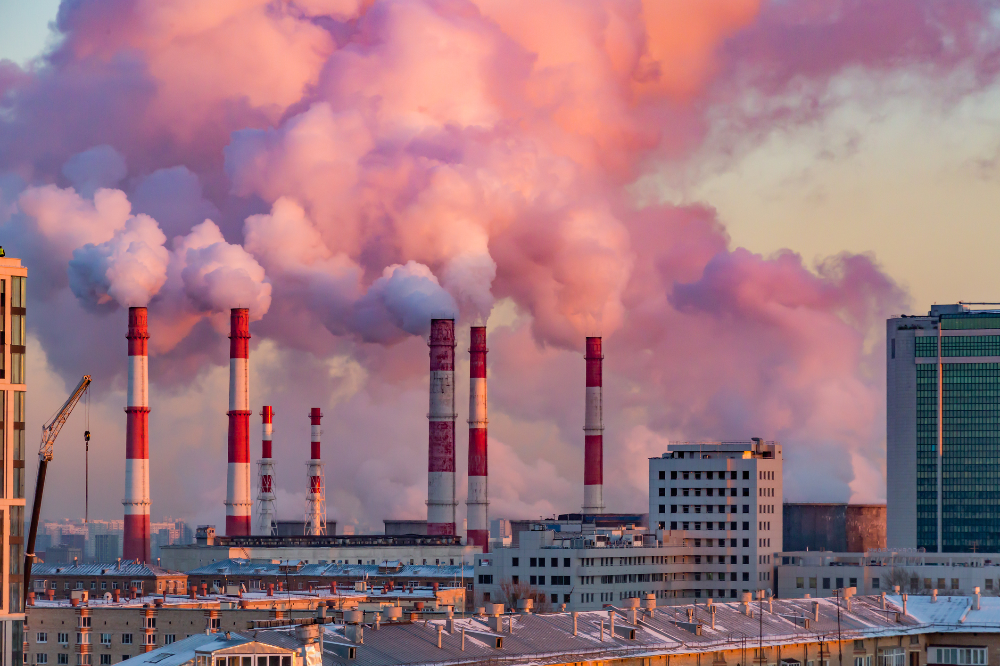


- Comparability: datasets have common attributes that can be used as keys 
  - Year 
  - Country_Code 


- Converted raw data into a ranking WHERE a rank of 1 would be the highest value of the category being looked at. 

# Mean annual pollution exposure rank, mean school year rank, GDP per capita rank, UHC index rank for year 1990

In [4]:

#open connection to execute an SQL query
try:
    conn = mysql.connector.connect(option_files=['connection.conf','password.conf'])
    db_cursor = conn.cursor()
    
    #enter query here
    query1 = ('''
 SELECT 
	c.`Year`, 
    c.Country_name, 
    c.Mean_Annual_Pollution_Exposure_Rank, 
    c.Mean_School_Year_Rank, 
    c.GDP_Per_Capita_rank, 
    rank() over (partition by (u.year) order by u.UHC_Index desc) as UHC_Index_rank
FROM `l02-6`.combined AS c 
	join 
		(select Year, Country_Code, UHC_Index 
         from `l02-6`.uhc) as u 
	on c.Country_code=u.Country_code and c.Year = u.Year
order by c.Mean_Annual_Pollution_Exposure_rank asc;''')
    
    #copy query result to the new list
    data1 = pd.read_sql(query1, conn)
    
    db_cursor.close()

except mysql.connector.Error as err:
  if err.errno == errorcode.ER_ACCESS_DENIED_ERROR:
    print("Something is wrong with your user name or password")
  elif err.errno == errorcode.ER_BAD_DB_ERROR:
    print("Database does not exist")
  else:
    print(err)
else:
  conn.close()

In [5]:
display(data1.head())
display(data1.tail())

,Year,Country_name,Mean_Annual_Pollution_Exposure_Rank,Mean_School_Year_Rank,GDP_Per_Capita_rank,UHC_Index_rank
0,1990,Qatar,1,73,20,29
1,1990,Niger,2,128,105,127
2,1990,Nepal,3,120,126,110
3,1990,India,4,108,112,120
4,1990,Egypt,5,99,91,94


,Year,Country_name,Mean_Annual_Pollution_Exposure_Rank,Mean_School_Year_Rank,GDP_Per_Capita_rank,UHC_Index_rank
124,1990,Canada,125,11,14,2
125,1990,Sweden,126,8,3,3
126,1990,Finland,127,47,4,9
127,1990,New Zealand,128,2,23,13
128,1990,Brunei,129,46,24,55


# Total deaths by disease rank, mean annual pollution exposure rank, mean school year rank,GDP per capita rank over the years 1990 - 2017

In [8]:


#open connection to execute an SQL query
try:
    conn = mysql.connector.connect(option_files=['connection.conf','password.conf'])
    db_cursor = conn.cursor()
    
    #enter query here
    query3 = ('''
SELECT 
pd.Country_Name, 
pd.Country_Code,
pd.Year,
pd.Liver_disease,
pd.Digestive_Disease,
pd.HIV_AIDS,
pd.Diarrheal_diseases,
pd.Intestinal_Infectious_Disease,
pd.Lower_Respiratory_Infections,
pd.Meningitis,
pd.Alzheimer_disease_and_other_dementias,
pd.Parkinson_disease,
pd.Malaria,
pd.Maternal_disorders,
pd.Neonatal_disorders,
pd.Nutritional_deficiencies,
pd.Diabetes_mellitus,
pd.Chronic_kidney_disease,
pd.Chronic_respiratory_diseases,
pd.Neoplasms,
pd.Protein_Energy_Malnutrition,
pd.Cardiovascular_Diseases,
pd.Mean_Annual_Pollution_Exposure,
eg.Mean_School_Year,
eg.GDP_Per_Capita,
cume_dist() over (partition by (year) order by pd.liver_disease ) * 100 as Liver_disease_rank,
cume_dist() over (partition by (year) order by pd.Digestive_Disease ) * 100 as Digestive_disease_rank,
cume_dist() over (partition by (year) order by pd.HIV_AIDS ) * 100 as HIV_AIDS_rank,
cume_dist() over (partition by (year) order by pd.Diarrheal_diseases ) * 100 as Diarrheal_disease_rank,
cume_dist() over (partition by (year) order by pd.Intestinal_Infectious_Disease ) * 100 as Intestinal_Infectious_disease_rank,
cume_dist() over (partition by (year) order by pd.Lower_Respiratory_Infections ) * 100 as Lower_Respiratory_Infections_rank,
cume_dist() over (partition by (year) order by pd.Meningitis ) * 100 as Meningitis_rank,
cume_dist() over (partition by (year) order by pd.Alzheimer_disease_and_other_dementias ) * 100 as Alzheimer_disease_and_other_dementias_rank,
cume_dist() over (partition by (year) order by pd.Parkinson_disease ) * 100 as Parkinson_disease_rank,
cume_dist() over (partition by (year) order by pd.Malaria ) * 100 as Malaria_rank,
cume_dist() over (partition by (year) order by pd.Maternal_disorders ) * 100 as Maternal_disorders_rank,
cume_dist() over (partition by (year) order by pd.Neonatal_disorders ) * 100 as Neonatal_disorders_rank,
cume_dist() over (partition by (year) order by pd.Nutritional_deficiencies ) * 100 as Nutritional_deficiencies_rank,
cume_dist() over (partition by (year) order by pd.Diabetes_mellitus ) * 100 as Diabetes_mellitus_rank,
cume_dist() over (partition by (year) order by pd.Chronic_kidney_disease ) * 100 as Chronic_kidney_disease_rank,
cume_dist() over (partition by (year) order by pd.Chronic_respiratory_diseases ) * 100 as Chronic_respiratory_diseases_rank,
cume_dist() over (partition by (year) order by pd.Neoplasms ) * 100 as Neoplasms_rank,
cume_dist() over (partition by (year) order by pd.Protein_Energy_Malnutrition ) * 100 as Protein_Energy_Malnutrition_rank,
cume_dist() over (partition by (year) order by pd.Cardiovascular_Diseases ) * 100 as Cardiovascular_Diseases_rank,
cume_dist() over (partition by (year) order by pd.Mean_Annual_Pollution_Exposure ) * 100 as Mean_Annual_Pollution_Exposure_rank,
cume_dist() over (partition by (year) order by eg.Mean_School_Year ) * 100 as Mean_School_Year_rank,
cume_dist() over (partition by (year) order by eg.GDP_Per_Capita ) * 100 as GDP_Per_Capita_rank

FROM

(SELECT d.*, 
p.Mean_Annual_Pollution_Exposure
FROM `l02-6`.death_type AS d JOIN `l02-6`.pollution AS p 
ON d.Country_Code = p.Country_Code AND d.Year = p.Year) AS pd

JOIN 

(SELECT e.*, g.GDP_Per_Capita
FROM `l02-6`.avg_education AS e JOIN `l02-6`.gdp_data AS g 
ON e.Country_Code = g.Country_Code AND e.Year = g.Year) AS eg 

ON pd.Country_Code = eg.Country_Code AND pd.Year = eg.Year
order by Year, Mean_Annual_Pollution_Exposure_rank;
''')
    
    #copy query result to the new list
    data3 = pd.read_sql(query3, conn)
    
    db_cursor.close()

except mysql.connector.Error as err:
  if err.errno == errorcode.ER_ACCESS_DENIED_ERROR:
    print("Something is wrong with your user name or password")
  elif err.errno == errorcode.ER_BAD_DB_ERROR:
    print("Database does not exist")
  else:
    print(err)
else:
  conn.close()

In [9]:
display(data3.head())
display(data3.tail())

,Country_Name,Country_Code,Year,Liver_Disease,Digestive_Disease,HIV_AIDS,Diarrheal_diseases,Intestinal_Infectious_Disease,Lower_Respiratory_Infections,Meningitis,...,Nutritional_deficiencies_rank,Diabetes_mellitus_rank,Chronic_kidney_disease_rank,Chronic_respiratory_diseases_rank,Neoplasms_rank,Protein_Energy_Malnutrition_rank,Cardiovascular_Diseases_rank,Mean_Annual_Pollution_Exposure_rank,Mean_School_Year_rank,GDP_Per_Capita_rank
0,Brunei,BRN,1990,14,32,1,1,0,38,4,...,3.100775,8.527132,3.100775,5.426357,3.875969,6.201550,2.325581,0.775194,65.116279,82.170543
1,New Zealand,NZL,1990,195,764,57,13,0,875,28,...,13.178295,26.356589,24.806202,39.534884,51.937984,15.503876,44.186047,1.550388,99.224806,82.945736
2,Finland,FIN,1990,572,1687,16,58,0,2007,44,...,11.627907,34.108527,19.379845,33.333333,61.240310,9.302326,57.364341,2.325581,64.341085,97.674419
3,Sweden,SWE,1990,827,2859,70,42,1,3702,71,...,25.581395,56.589147,37.984496,55.813953,72.093023,28.682171,72.868217,3.100775,94.573643,98.449612
4,Canada,CAN,1990,2944,6928,797,54,2,5690,153,...,44.961240,80.620155,73.643411,78.294574,86.821705,44.186047,80.620155,3.875969,92.248062,89.922481


,Country_Name,Country_Code,Year,Liver_Disease,Digestive_Disease,HIV_AIDS,Diarrheal_diseases,Intestinal_Infectious_Disease,Lower_Respiratory_Infections,Meningitis,...,Nutritional_deficiencies_rank,Diabetes_mellitus_rank,Chronic_kidney_disease_rank,Chronic_respiratory_diseases_rank,Neoplasms_rank,Protein_Energy_Malnutrition_rank,Cardiovascular_Diseases_rank,Mean_Annual_Pollution_Exposure_rank,Mean_School_Year_rank,GDP_Per_Capita_rank
1717,Saudi Arabia,SAU,2017,2461,3109,526,212,0,3505,145,...,40.555556,58.888889,75.000000,56.666667,58.333333,42.777778,65.555556,97.777778,57.222222,80.555556
1718,India,IND,2017,217896,419545,52106,719083,0,507364,50052,...,100.000000,100.000000,100.000000,100.000000,99.444444,99.444444,99.444444,98.333333,27.222222,25.555556
1719,Qatar,QAT,2017,114,159,7,3,0,91,6,...,5.555556,22.777778,13.888889,6.666667,15.000000,3.333333,12.777778,98.888889,61.111111,97.222222
1720,Niger,NER,2017,1504,4412,1951,21955,0,19710,7815,...,84.444444,52.777778,56.666667,58.888889,47.777778,84.444444,45.555556,99.444444,1.111111,3.888889
1721,Nepal,NPL,2017,5671,9756,2619,10796,0,9297,837,...,74.444444,78.333333,81.111111,90.000000,68.888889,69.444444,73.888889,100.000000,16.111111,12.777778



# Global Death, GDP Per Capita, Pollution, Education, and Health Coverage in 1990

- Combine all five datasets (INNER JOIN)
- Add a rank column for each field/variable, by year using RANK() function (1st rank = highest value of the year) 

Or:
- Combined Table + Health Coverage Table
- Rank each country's Health Coverage


In [10]:

#Combining all five datasets


#open connection to execute an SQL query
try:
    conn = mysql.connector.connect(option_files=['connection.conf','password.conf'])
    db_cursor = conn.cursor()
    
    #enter query here
    query4 = ('''SELECT 
                    c.*,
                    u.UHC_Index,
                    RANK() OVER (PARTITION BY Year ORDER BY u.UHC_Index DESC) AS UHC_Index_rank
                FROM
                    combined AS c JOIN uhc AS u USING(Country_Code, Year);
            ''')
    
    #get query results
    data4 = pd.read_sql(query4, conn)
    
    db_cursor.close()

except mysql.connector.Error as err:
  if err.errno == errorcode.ER_ACCESS_DENIED_ERROR:
    print("Something is wrong with your user name or password")
  elif err.errno == errorcode.ER_BAD_DB_ERROR:
    print("Database does not exist")
  else:
    print(err)
else:
  conn.close()

In [11]:
display(data4.head())
display(data4.tail())

,Country_Name,Country_code,Year,Liver_Disease,Digestive_Disease,HIV_AIDS,Diarrheal_diseases,Intestinal_Infectious_Disease,Lower_Respiratory_Infections,Meningitis,...,Chronic_kidney_disease_rank,Chronic_respiratory_diseases_rank,Neoplasms_rank,Protein_Energy_Malnutrition_rank,Cardiovascular_Diseases_rank,Mean_Annual_Pollution_Exposure_rank,Mean_School_Year_rank,GDP_Per_Capita_rank,UHC_Index,UHC_Index_rank
0,Japan,JPN,1990,22684,38521,84,951,6,54123,734,...,5,12,5,62,8,107,15,9,80.8817,1
1,Canada,CAN,1990,2944,6928,797,54,2,5690,153,...,35,29,18,73,26,125,11,14,79.7969,2
2,Sweden,SWE,1990,827,2859,70,42,1,3702,71,...,81,58,37,93,36,126,8,3,78.7949,3
3,Iceland,ISL,1990,12,46,2,1,0,83,3,...,129,125,119,127,123,124,30,8,78.2034,4
4,Switzerland,CHE,1990,806,1732,176,75,0,2250,143,...,92,59,42,84,53,108,12,1,77.1674,5


,Country_Name,Country_code,Year,Liver_Disease,Digestive_Disease,HIV_AIDS,Diarrheal_diseases,Intestinal_Infectious_Disease,Lower_Respiratory_Infections,Meningitis,...,Chronic_kidney_disease_rank,Chronic_respiratory_diseases_rank,Neoplasms_rank,Protein_Energy_Malnutrition_rank,Cardiovascular_Diseases_rank,Mean_Annual_Pollution_Exposure_rank,Mean_School_Year_rank,GDP_Per_Capita_rank,UHC_Index,UHC_Index_rank
124,Democratic Republic of Congo,COD,1990,6771,12854,19707,34416,834,52954,9414,...,22,28,39,4,37,23,115,120,22.9475,125
125,Mali,MLI,1990,1826,3405,502,23295,641,12200,6045,...,47,46,66,7,69,26,127,118,20.9199,126
126,Niger,NER,1990,1068,2675,199,32061,663,25299,12367,...,55,67,79,23,88,2,128,105,17.9624,127
127,Laos,LAO,1990,877,1722,0,4367,431,10014,940,...,69,61,88,44,72,60,105,124,15.4171,128
128,Haiti,HTI,1990,1004,2433,2340,10469,7,7937,1743,...,62,64,71,32,60,93,111,106,11.8838,129


# A closer look

"Combined" dataset: A result of Albert's second query. Contains the ranking of deaths by diseases, pollution, education, and gdp per capita.

First Query: 
- Do an "as close as possible" join between the combined and UHC datasets for the year 2010.

Second Query:
- Each country's average rank in their first and last recorded years.

In [12]:


#open connection to execute an SQL query
try:
    conn = mysql.connector.connect(option_files=['connection.conf','password.conf'])
    
    # Query to do an approximate join between the table that contains everything except the UHC
    # dataset, and the UHC dataset for the year 2010.
    query5 = ('''
    select
        u.Year as corresponding_uhc_year,
        u.uhc_index_rank,
        comb.*
    from
        (select c.* from combined c join
            (select Country_Code, Country_Name, group_concat(Year order by abs(Year-2010)) nearest2010 from
                combined group by Country_Name) t2
            on c.Country_Name=t2.Country_Name and c.Year=t2.nearest2010
        ) comb,
    (select
        Country_Code, Country_Name, Year,
            ntile(200) over (partition by Year order by uhc_index) as uhc_index_rank
    from uhc where year=2010) u
    where
        comb.Country_Code=u.Country_Code;
    ''')
    
    # Query to find the average of pollution, education, and gdp for each country in the first 
    # and last year that they are present in the dataset that contains everything except 
    # the UHC dataset
    query6 = ('''
    select 
        first.Country_Name, first.Year firstYear,
        ((184-first.mean_annual_pollution_exposure_rank) + first.mean_school_year_rank +
            first.gdp_per_capita_rank)/3 first_avg,
        last.Year lastYear,
        ((184-last.mean_annual_pollution_exposure_rank) + last.mean_school_year_rank +
            last.gdp_per_capita_rank)/3 last_avg
    from 
        (select c.* from combined c join
            (select Country_Name, min(Year) minyear from combined group by Country_Name) t2
            on c.Country_Name = t2.Country_Name and c.Year = t2.minyear
        ) first,
        (select c.* from combined c join
            (select Country_Name, max(Year) maxyear from combined group by Country_Name) t2
            on c.Country_Name = t2.Country_Name and c.Year = t2.maxyear
        ) last
    where 
        first.Country_Code = last.Country_Code order by first.Country_Code;
    ''')
    
    data5 = pd.read_sql(query5, conn)
    data6 = pd.read_sql(query6, conn)
       
    
except mysql.connector.Error as err:
  if err.errno == errorcode.ER_ACCESS_DENIED_ERROR:
    print("Something is wrong with your user name or password")
  elif err.errno == errorcode.ER_BAD_DB_ERROR:
    print("Database does not exist")
  else:
    print(err)
else:
  conn.close()

In [13]:
# Results of the first query.
display(data5.set_index("Country_Name").head())
display(data5.set_index("Country_Name").tail())

,corresponding_uhc_year,uhc_index_rank,Country_code,Year,Liver_Disease,Digestive_Disease,HIV_AIDS,Diarrheal_diseases,Intestinal_Infectious_Disease,Lower_Respiratory_Infections,...,Nutritional_deficiencies_rank,Diabetes_mellitus_rank,Chronic_kidney_disease_rank,Chronic_respiratory_diseases_rank,Neoplasms_rank,Protein_Energy_Malnutrition_rank,Cardiovascular_Diseases_rank,Mean_Annual_Pollution_Exposure_rank,Mean_School_Year_rank,GDP_Per_Capita_rank
Country_Name,,,,,,,,,,,,,,,,,,,,,
Afghanistan,2010,4,AFG,2011,1989,4850,177,7053,300,23115,...,38,38,43,41,60,38,43,10,166,175
Angola,2010,6,AGO,2011,4451,7113,13797,21595,415,18432,...,11,53,59,67,77,10,82,51,151,98
Azerbaijan,2010,41,AZE,2011,2775,3492,37,238,0,3516,...,115,89,94,89,82,111,55,102,50,78
Bangladesh,2010,84,BGD,2011,25375,41026,442,26979,13008,52920,...,8,8,13,5,21,7,11,8,144,160
Belize,2010,91,BLZ,2011,41,69,73,11,0,93,...,139,163,165,171,170,134,171,74,54,101


,corresponding_uhc_year,uhc_index_rank,Country_code,Year,Liver_Disease,Digestive_Disease,HIV_AIDS,Diarrheal_diseases,Intestinal_Infectious_Disease,Lower_Respiratory_Infections,...,Nutritional_deficiencies_rank,Diabetes_mellitus_rank,Chronic_kidney_disease_rank,Chronic_respiratory_diseases_rank,Neoplasms_rank,Protein_Energy_Malnutrition_rank,Cardiovascular_Diseases_rank,Mean_Annual_Pollution_Exposure_rank,Mean_School_Year_rank,GDP_Per_Capita_rank
Country_Name,,,,,,,,,,,,,,,,,,,,,
Norway,2010,195,NOR,2011,368,1389,21,342,0,1859,...,114,121,113,76,73,113,95,176,5,2
Singapore,2010,194,SGP,2011,213,459,20,6,0,2050,...,173,147,127,129,111,166,127,128,33,9
Spain,2010,191,ESP,2011,7884,19941,961,813,3,11208,...,69,27,20,14,13,80,23,169,71,29
Sweden,2010,190,SWE,2011,1026,2943,33,612,0,2734,...,100,78,90,56,45,98,56,181,13,7
Switzerland,2010,197,CHE,2011,917,2516,42,183,0,1447,...,108,101,85,78,57,110,78,164,2,3


In [14]:
# Results of the second query.
data6.sort_values(by="last_avg", axis=0, inplace=True)
# Get the top 10 and bottom 10.
data_top = data6.iloc[:10]
data_bottom = data6.iloc[-10:]
# Melt the dataframes, for plotting purposes.
df_top = pd.melt(data_top.loc[:, ["Country_Name", "first_avg", "last_avg"]],
                id_vars=["Country_Name"], var_name="Year",
                value_name="value")
df_bottom = pd.melt(data_bottom.loc[:, ["Country_Name", "first_avg", "last_avg"]],
                id_vars=["Country_Name"], var_name="Year",
                value_name="value")
# Sort them, again for plotting purposes.
df_top.sort_values(by=["Year", "value"], ascending=[True, True], axis=0, inplace=True)
df_bottom.sort_values(by=["Year", "value"], ascending=[True, True], axis=0, inplace=True)

fig_top = px.bar(df_top, x="Country_Name", y="value", color="Year", barmode="group",
                title="Top 10 Countries In Their First Year",
                labels={"Country_Name": "Country Name",
                       "value":"Average Rank (out of 183)"})


fig_bottom = px.bar(df_bottom, x="Country_Name", y="value", color="Year", barmode="group",
                title="Bottom 10 Countries In Their First Year",
                labels={"Country_Name": "Country Name",
                       "value":"Average Rank (out of 183)"})


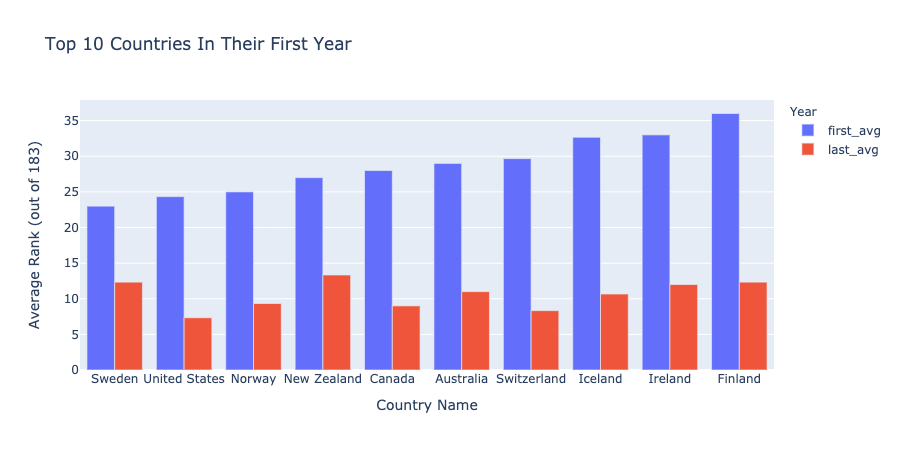

In [15]:
fig_top.show()


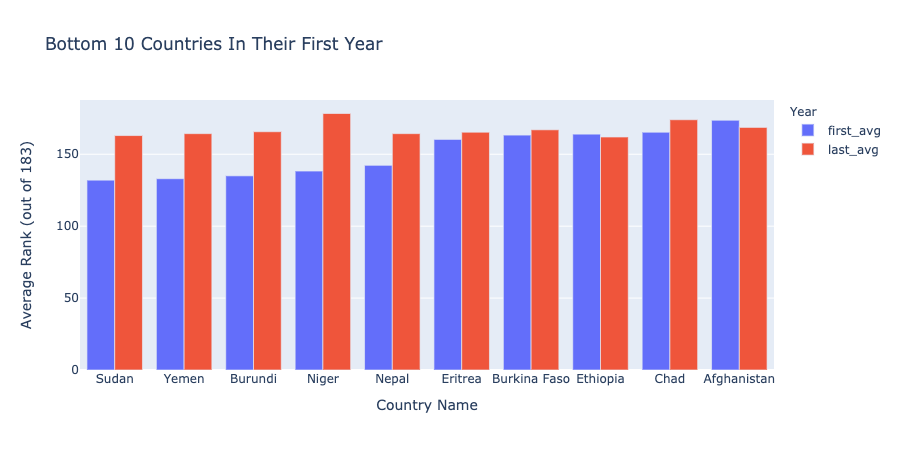

In [16]:
fig_bottom.show()

# UHC Index and Death Count 

- Computing ranks across UHC index and total death count for the years 1990 and 2010 for all countries

- How do the two variables relate to each other?

In [17]:

#open connection to execute an SQL query
try:
    conn = mysql.connector.connect(option_files=['connection.conf','password.conf'])
    db_cursor = conn.cursor()
    
    #enter query here
    
    query7 = ('''SELECT
                    u.Country_Name, 
                    u.Country_Code,
                    u.Year,
                    u.UHC_Index,
                    (pd.Liver_disease +
                    pd.Digestive_Disease +
                    pd.HIV_AIDS +
                    pd.Diarrheal_diseases +
                    pd.Intestinal_Infectious_Disease +
                    pd.Lower_Respiratory_Infections +
                    pd.Meningitis +
                    pd.Alzheimer_disease_and_other_dementias +
                    pd.Parkinson_disease +
                    pd.Malaria +
                    pd.Maternal_disorders +
                    pd.Neonatal_disorders +
                    pd.Nutritional_deficiencies +
                    pd.Diabetes_mellitus +
                    pd.Chronic_kidney_disease +
                    pd.Chronic_respiratory_diseases +
                    pd.Neoplasms +
                    pd.Protein_Energy_Malnutrition +
                    pd.Cardiovascular_Diseases) AS Total_Death,
                    RANK() OVER (PARTITION BY Year ORDER BY u.UHC_Index DESC) AS UHC_Index_Rank,
                    RANK() OVER (PARTITION BY Year ORDER BY Total_Death DESC) AS Total_Death_Rank
                FROM
                    death_type AS pd JOIN uhc AS u USING(Country_Code, Year);''')
            
    
    #copy query result to the new list
    data7 = pd.read_sql(query7, conn)
    
    db_cursor.close()

except mysql.connector.Error as err:
  if err.errno == errorcode.ER_ACCESS_DENIED_ERROR:
    print("Something is wrong with your user name or password")
  elif err.errno == errorcode.ER_BAD_DB_ERROR:
    print("Database does not exist")
  else:
    print(err)
else:
  conn.close()

In [18]:
display(data7.head())
display(data7.tail())

,Country_Name,Country_Code,Year,UHC_Index,Total_Death,UHC_Index_Rank,Total_Death_Rank
0,China,CHN,1990,49.8103,6793986,82,1
1,India,IND,1990,26.9491,6368008,170,2
2,United States of America,USA,1990,73.4118,1942091,7,3
3,Russian Federation,RUS,1990,54.239,1396952,57,4
4,Nigeria,NGA,1990,22.5911,1093384,180,5


,Country_Name,Country_Code,Year,UHC_Index,Total_Death,UHC_Index_Rank,Total_Death_Rank
383,Bermuda,BMU,2010,73.7297,414,37,190
384,Marshall Islands,MHL,2010,42.1253,326,144,191
385,Greenland,GRL,2010,63.5621,324,59,192
386,American Samoa,ASM,2010,53.9934,254,100,193
387,Northern Mariana Islands,MNP,2010,63.6531,191,58,194



# Visualizing relationships from the combined dataset
- Meningitis (inflammation of the meninges that surround brain and spinal cord)
- Diabetes Mellitus  (insulin vs glucose)
- Neoplasms (tumors both benign and malignant)


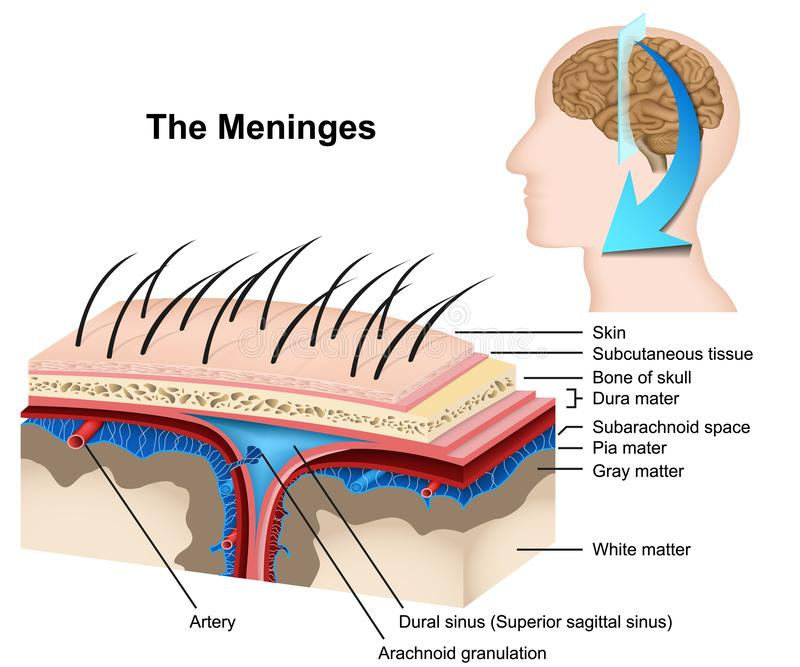

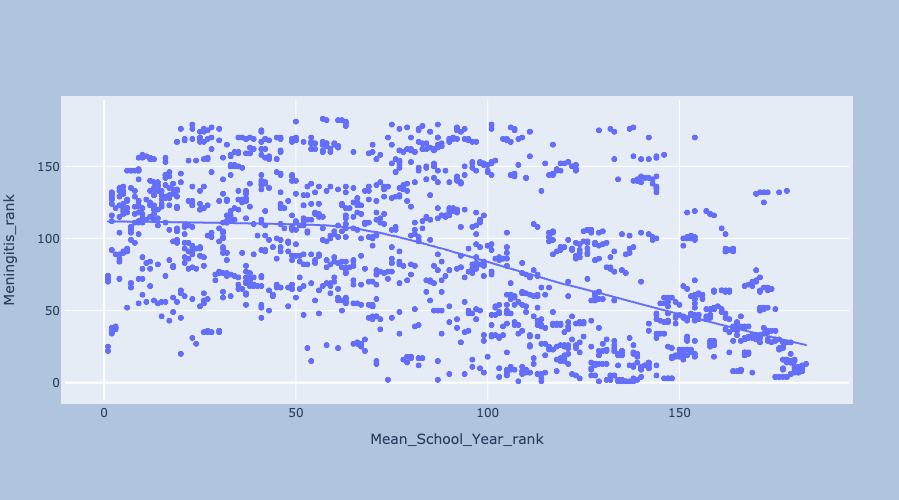

In [19]:
fig1 = px.scatter(data2,x='Mean_Annual_Pollution_Exposure_rank',y='Meningitis_rank',trendline = 'lowess')
fig1.data[1].update(line_color='red') 
fig1.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

fig2 = px.scatter(data2,x='GDP_Per_Capita_rank',y='Meningitis_rank',trendline = 'lowess')
fig2.data[1].update(line_color='red') 
fig2.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

fig3 = px.scatter(data2,x='Mean_School_Year_rank',y='Meningitis_rank',trendline = 'lowess')
fig3.data[1].update(line_color='red') 
fig3.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

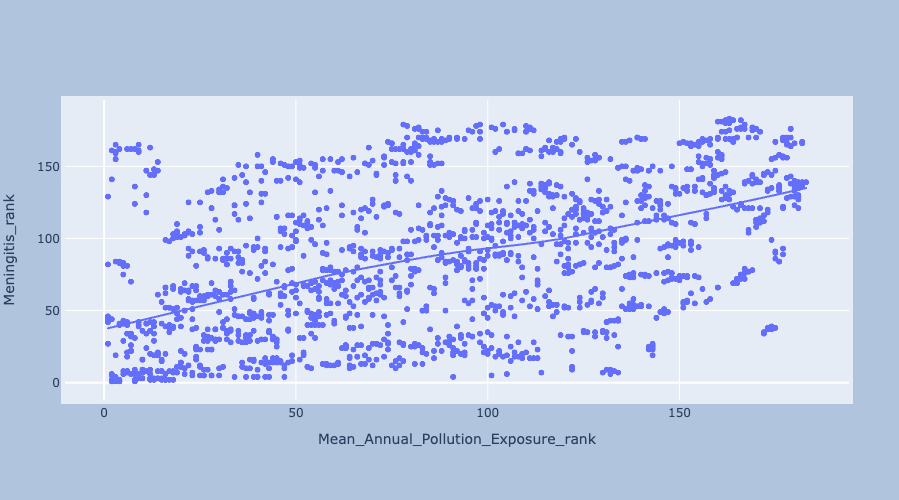

In [20]:
fig1.show()

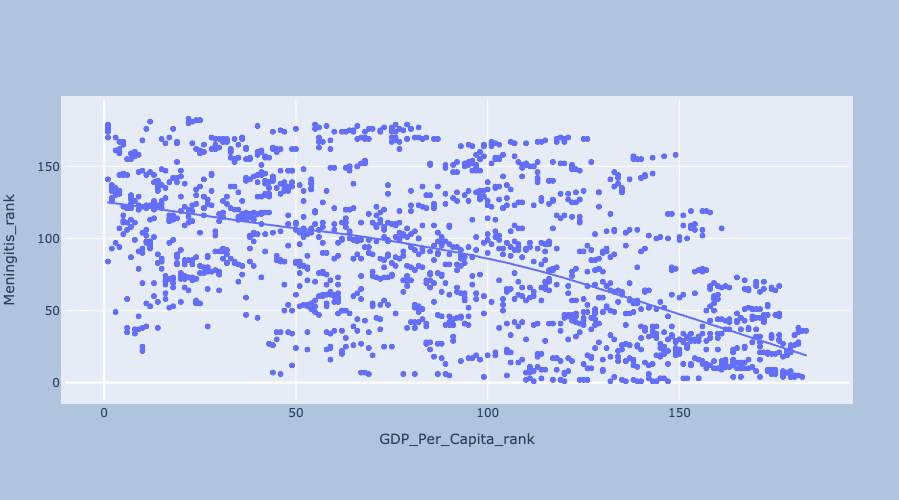

In [21]:
fig2.show()

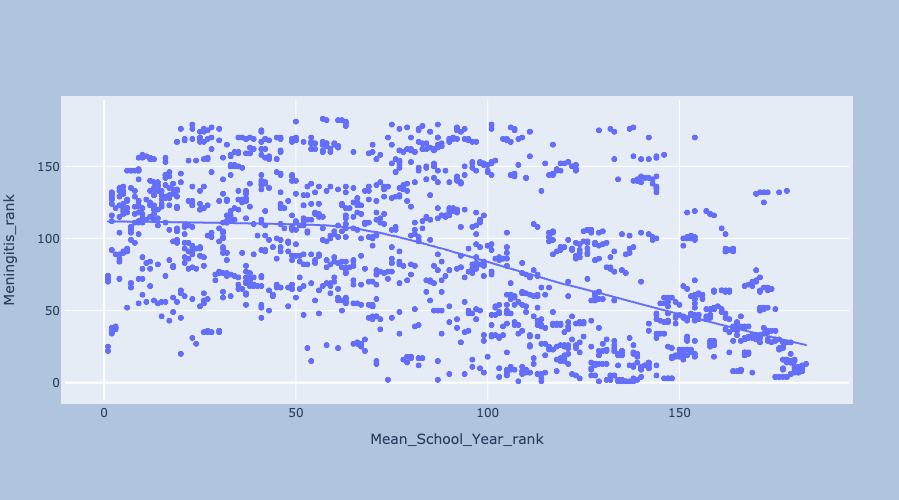

In [22]:
fig3.show()

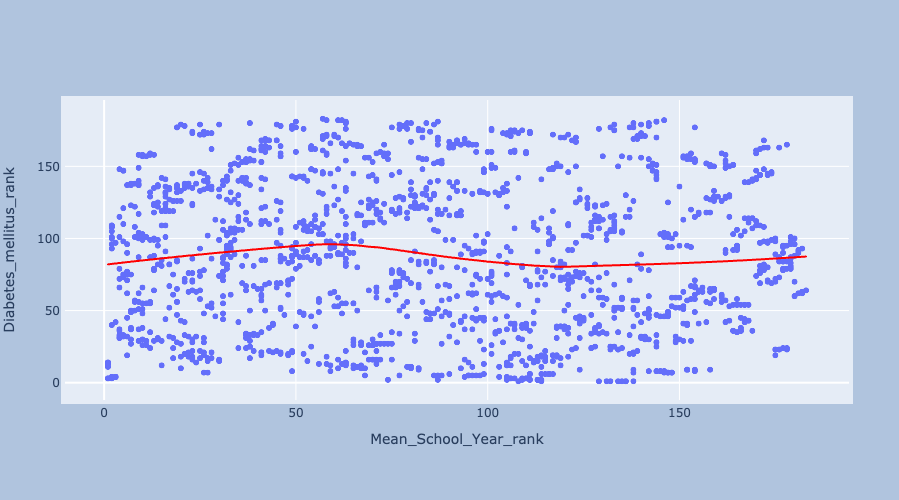

In [23]:
fig4 = px.scatter(data2,x='Mean_Annual_Pollution_Exposure_rank',y='Diabetes_mellitus_rank',trendline = 'lowess')
fig4.data[1].update(line_color='red') 
fig4.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

fig5 = px.scatter(data2,x='GDP_Per_Capita_rank',y='Diabetes_mellitus_rank',trendline = 'lowess')
fig5.data[1].update(line_color='red') 
fig5.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

fig6 = px.scatter(data2,x='Mean_School_Year_rank',y='Diabetes_mellitus_rank',trendline = 'lowess')
fig6.data[1].update(line_color='red') 
fig6.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

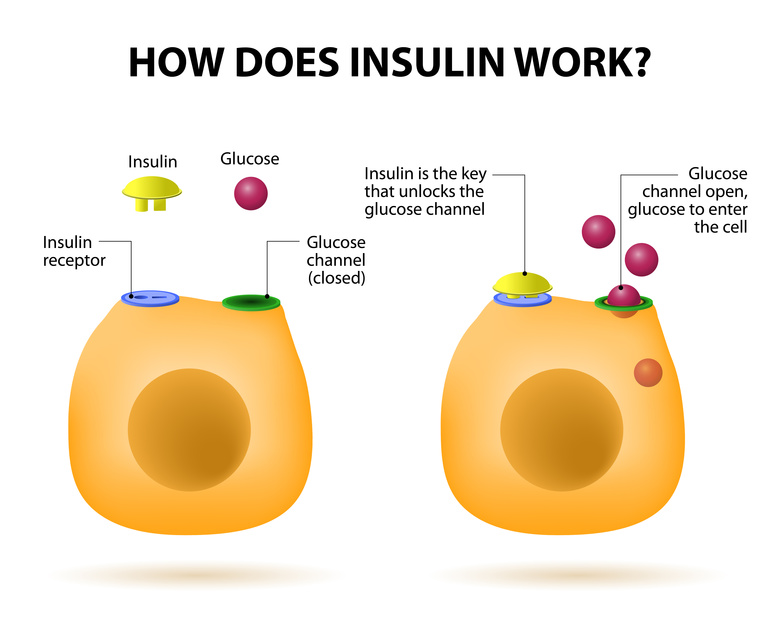

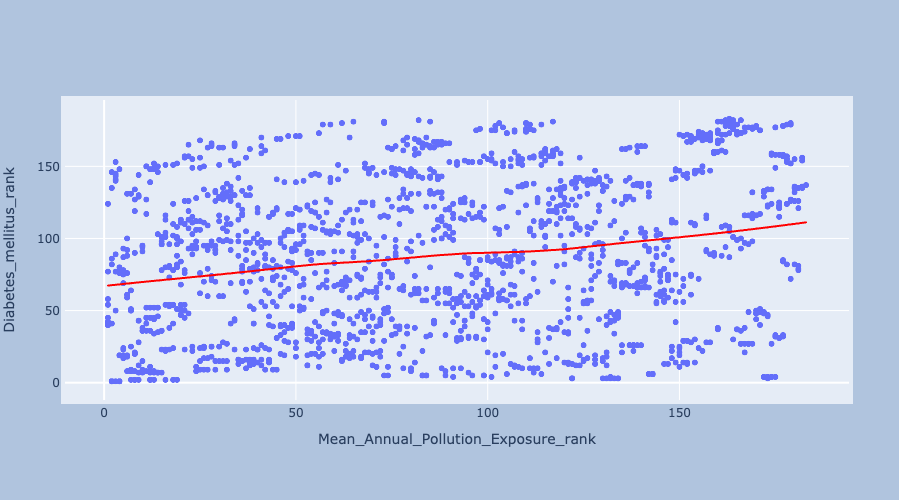

In [24]:
fig4.show()

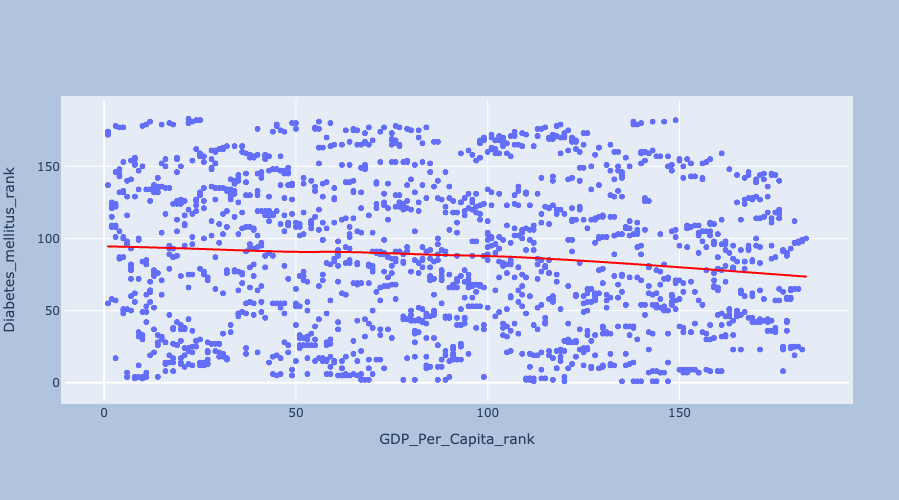

In [25]:
fig5.show()

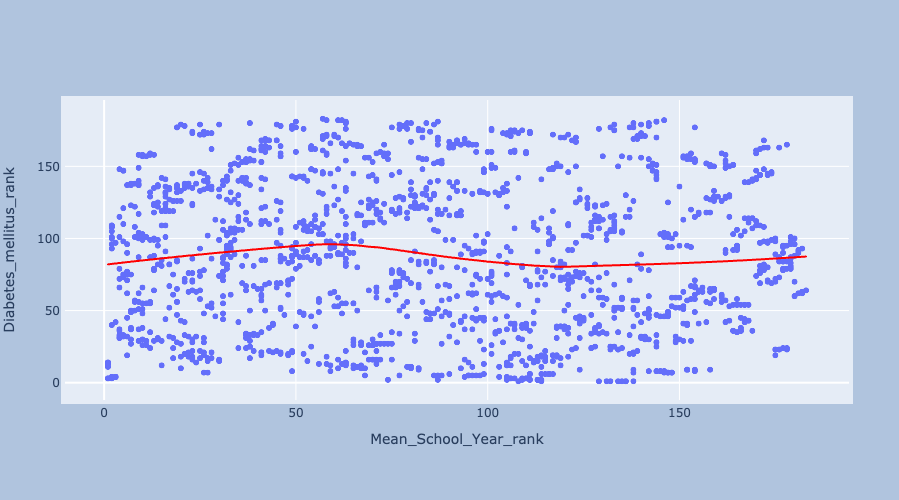

In [26]:
fig6.show()

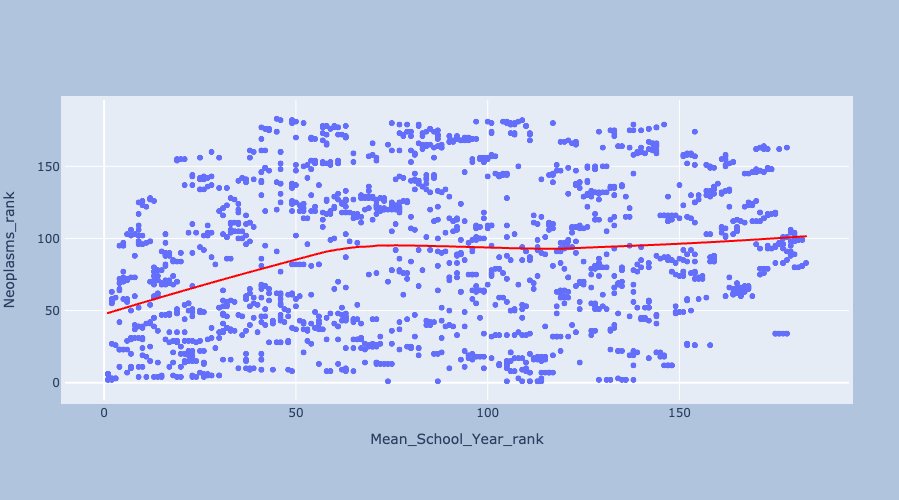

In [27]:
fig7 = px.scatter(data2,x='Mean_Annual_Pollution_Exposure_rank',y='Neoplasms_rank',trendline = 'lowess')
fig7.data[1].update(line_color='red') 
fig7.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

fig8 = px.scatter(data2,x='GDP_Per_Capita_rank',y='Neoplasms_rank',trendline = 'lowess')
fig8.data[1].update(line_color='red') 
fig8.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

fig9 = px.scatter(data2,x='Mean_School_Year_rank',y='Neoplasms_rank',trendline = 'lowess')
fig9.data[1].update(line_color='red') 
fig9.update_layout(autosize=False,width=1000,height=500,margin
                   =dict(l=50,r=50,b=100,t=100,pad=4),paper_bgcolor="LightSteelBlue",)

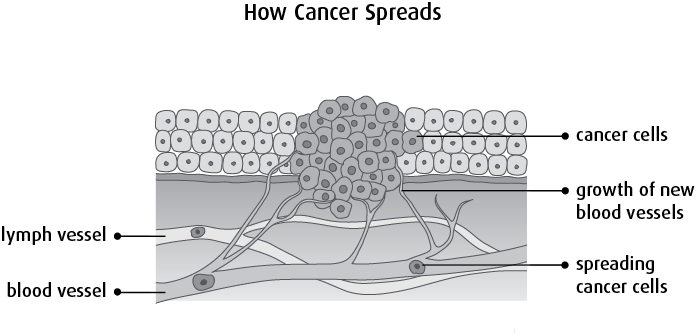

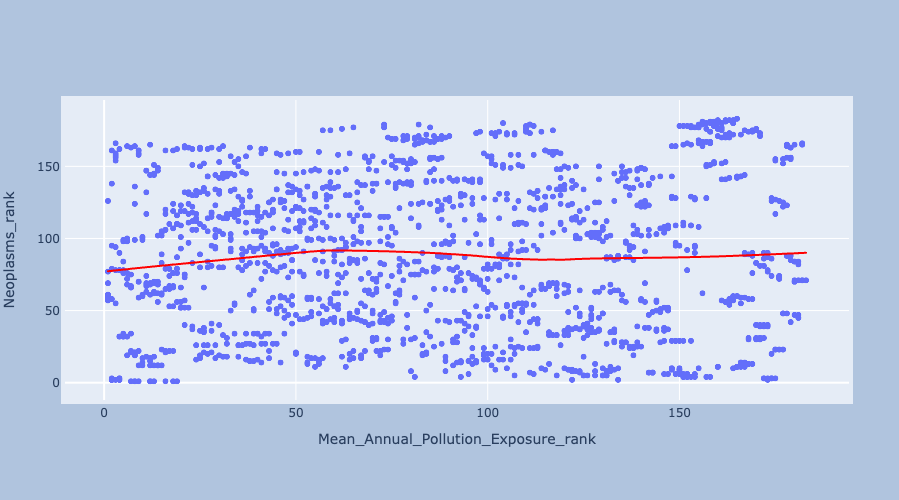

In [28]:
fig7.show()

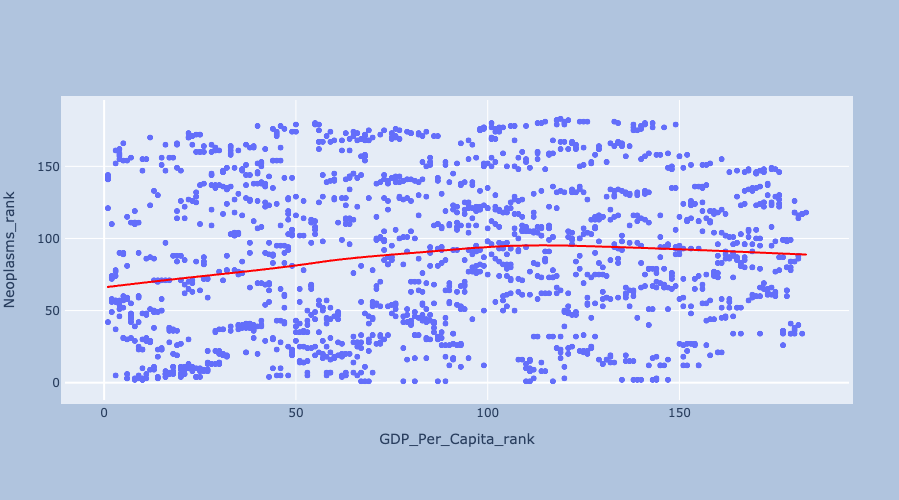

In [29]:
fig8.show()

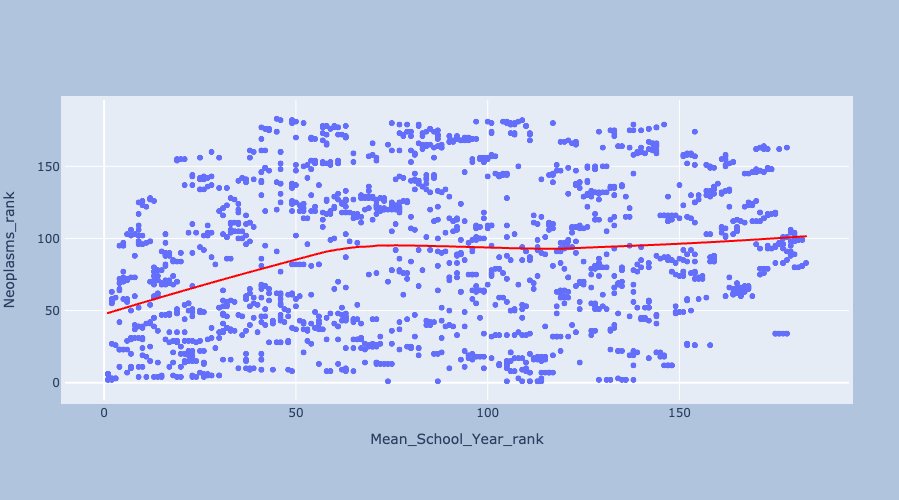

In [30]:
fig9.show()

# Where are we going next?

- Look at all relationships and categorize them into which diseases relate to which predictors to find out an overall picture

- Add more factors within countries that describe other areas of a countries economic, cultural or educational standing

- Population is a key factor not studied - Countries like India and China with large populations may end up skewing the data
  - Could have used deaths/100,000 people for a direct comparison or a potential ratio between deaths and predictor
- Additonal visualizations can be made to demonstrate patterns to yet be found in the data

# Thank you!

References

Canadian Cancer Society, 2020. How Cancer Grows. [image] Available at: <https://www.cancer.ca/en/cancer-information/cancer-101/what-is-cancer/how-cancer-starts-grows-and-spreads/?region=on> [Accessed 2 December 2020].

Diabetes Library, 2020. How Does Insulin Work?. [image] Available at: <https://diabeteslibrary.org/insulin-vs-glucagon/> [Accessed 2 December 2020].

Medical Stocks, 2020. Meninges Medical 3D Illustration. [image] Available at: <https://www.dreamstime.com/meninges-medical-d-illustration-white-background-eps-cross-view-human-brain-meninges-medical-d-illustration-white-image142325632> [Accessed 2 December 2020].
